Creating the cytokine expression along the crypt-villus axis heatmap

In [ ]:
import os

# important for gpd.sjoin
os.environ["USE_PYGEOS"] = "0"

import scanpy as sc
import scvelo as scv
import geopandas as gpd

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.gridspec import GridSpecFromSubplotSpec
from mpl_toolkits.axes_grid1 import AxesGrid
from matplotlib.patches import Rectangle

# import mpl_scatter_density # adds projection='scatter_density'
import numpy as np
import warnings
import seaborn as sns
import igraph
import random
from shapely.geometry import Polygon, Point
from scipy.spatial import KDTree
import scipy.sparse as sp
from tqdm.notebook import tqdm
from PIL import Image, ImageDraw

warnings.filterwarnings("ignore")

### Load Dataset

In [ ]:
# Paths/config for Xenium Clone 13
cl13_path = "/mnt/sata1/Dhruv_Analysis_1/2025_10_31_Clone13/combined/final_adata.h5ad"

arm_p14_path = '/mnt/sata1/Dhruv_Analysis_1/spatial_paper_data/spatial_data_p14_ab_Xist.h5ad'

arm_path = '/mnt/sata1/Dhruv_Analysis_1/spatial_paper_data/spatial_data_all_cells.h5ad'

sortby_var = "crypt_villi_axis"  # change if you have a different ordering variable

Load the Xenium data (this replaces the Visium/10x loading used in the original notebook).

In [ ]:
# Clone13 adata
cl13_adata = sc.read_h5ad(cl13_path)

cl13_adata.obs["Subtype"] = cl13_adata.obs["resolvi_predicted"]

# need to normalize data
sc.pp.normalize_total(cl13_adata, target_sum=1e4)
sc.pp.log1p(cl13_adata)

gidx = cl13_adata.var_names.get_loc("Xist")
X = cl13_adata.X
if sp.issparse(X):
    mask = X[:, gidx].toarray().ravel() > 0
else:
    mask = X[:, gidx] > 0

adata_xist = cl13_adata[mask].copy()
print(cl13_adata.obs.shape)
print(adata_xist.obs.shape)

cl13_p14_adata = adata_xist[
    adata_xist.obs["Subtype"].isin(["Cd8_T-Cell_P14", "Cd8_T-Cell_ab+"])
]

(674090, 34)
(7422, 34)


In [ ]:
# Armstrong adata
arm_adata = sc.read_h5ad(arm_path)


gidx = arm_adata.var_names.get_loc("Xist")
X = arm_adata.X
if sp.issparse(X):
    mask = X[:, gidx].toarray().ravel() > 0
else:
    mask = X[:, gidx] > 0

# data is already normalized
adata_xist = arm_adata[mask].copy()
print(arm_adata.obs.shape)
print(adata_xist.obs.shape)

arm_p14_adata = adata_xist[
    adata_xist.obs["Subtype"].isin(["Cd8_T-Cell_P14", "Cd8_T-Cell_ab+"])
]

datasets = {
    "cl13": cl13_p14_adata,
    "arm": arm_p14_adata,
}

(15333, 19)
(15333, 19)


In [ ]:
# all data not just p14 xist positive
cl13_adata = sc.read_h5ad(cl13_path)

cl13_adata.obs["Subtype"] = cl13_adata.obs["resolvi_predicted"]

sc.pp.normalize_total(cl13_adata, target_sum=1e4)
sc.pp.log1p(cl13_adata)

arm_adata = sc.read_h5ad(arm_path)


# NOT ACTUALLLY P14 ADATA< JUST DIDN"T WANT TO CHANGE THE NAME
cl13_p14_adata = cl13_adata.copy()
arm_p14_adata = arm_adata.copy()

datasets = {
    "cl13": cl13_p14_adata,
    "arm": arm_p14_adata,
}

In [ ]:
print(cl13_p14_adata.X.shape)
print(arm_p14_adata.X.shape)

(674090, 480)
(596928, 350)


In [ ]:
def check_X_units(adata, name):
    X = adata.X
    mn = X.min()
    mx = X.max()
    print(name, "X.min/max:", float(mn), float(mx))
    # if X is log-normalized, max usually ~ 6–12-ish for typical genes
    # if raw-ish counts, max can be 100s–1000s
    # if scaled, min will be < 0 (often a lot)

check_X_units(cl13_p14_adata, "cl13")
check_X_units(arm_p14_adata, "arm")


cl13 X.min/max: 0.0 8.838921546936035
arm X.min/max: 0.0 8.733577728271484


##### Making the Visium figures - gene expression trends and spatial axes

In [ ]:
import matplotlib.colors as clr

zissou = [
    "#3A9AB2",
    "#6FB2C1",
    "#91BAB6",
    "#A5C2A3",
    "#BDC881",
    "#DCCB4E",
    "#E3B710",
    "#E79805",
    "#EC7A05",
    "#EF5703",
    "#F11B00",
]

colormap = clr.LinearSegmentedColormap.from_list("Zissou", zissou)
colormap_r = clr.LinearSegmentedColormap.from_list("Zissou", zissou[::-1])

In [ ]:
def run_cytokine_gradient(adata, dataset_name, df_cytokines, sortby_var):
    # Confirm the ordering variable exists
    if sortby_var not in adata.obs.columns:
        raise ValueError(
            f"`{sortby_var}` not found in {dataset_name}.obs; provide an ordering variable to sort the heatmap."
        )

    # Drop cells where the ordering variable is missing
    adata_ = adata[~adata.obs[sortby_var].isna()].copy()

    # Optional: map ordering variable from a reference object using nearest neighbors.
    # For Xenium, leave use_kdtree_mapping=False unless you need cross-modality mapping.
    use_kdtree_mapping = False
    if use_kdtree_mapping:
        tree = KDTree(adata_.obsm["X_spatial"])
        cv = []
        epi = []
        cv_values = adata_.obs.get("crypt_villi_axis", adata_.obs[sortby_var]).values
        epi_values = (
            adata_.obs["epithelial_distance"].values
            if "epithelial_distance" in adata_.obs
            else np.array([])
        )
        ids = tree.query(
            adata_.obs[["pxl_row_in_fullres", "pxl_col_in_fullres"]].values, k=5
        )[1]
        for k in range(len(ids)):
            cv_axis = np.mean(cv_values[ids[k]])
            epithelial = np.mean(epi_values[ids[k]]) if len(epi_values) else np.nan
            cv.append(cv_axis)
            epi.append(epithelial)
        adata_.obs["crypt_villi_axis"] = cv
        adata_.obs["epithelial_distance"] = epi

    cytokine_genes = df_cytokines["gene"][
        df_cytokines["gene"].isin(adata_.var_names)
    ].to_list()

    in_xenium = adata_.var.index.values

    if "X_spatial" not in adata_.obsm and {
        "pxl_col_in_fullres",
        "pxl_row_in_fullres",
    }.issubset(adata_.obs.columns):
        adata_.obsm["X_spatial"] = adata_.obs[
            ["pxl_col_in_fullres", "pxl_row_in_fullres"]
        ].values

    all_spatial = adata_.obsm["X_spatial"]
    # red hex code
    image_colors = ["#FF0000" for v in adata_.obs.index]

    # D6, D7, D30 #downsize = 20
    downsize = 50
    # Example 2D point array (replace this with your own data)
    points = all_spatial / downsize

    # Define the size of the image (adjust as needed)
    image_width = 2000
    image_height = 2000

    # Create a white canvas as the base image
    base_image = Image.new("RGB", (image_width, image_height), (255, 255, 255))

    # Draw the points on the image
    draw = ImageDraw.Draw(base_image)
    point_size = 1  # Size of the points
    ct = 0
    for point in points:
        draw.ellipse(
            (
                point[0] - point_size,
                point[1] - point_size,
                point[0] + point_size,
                point[1] + point_size,
            ),
            fill=image_colors[ct],
        )
        ct += 1

    file_path = f"cytokine gradient images/Subtype_image_{dataset_name}.png"
    base_image.save(file_path)

    from tqdm.notebook import tqdm
    from shapely.geometry import Point, Polygon
    import json

    remove_ids = []
    current_adata = adata_.copy()

    json_file_path = os.path.join(f"cytokine gradient images/Subtype_image_{dataset_name}.json")
    all_spatial = current_adata.obsm["X_spatial"]

    total_indices = []
    if os.path.exists(json_file_path):
        with open(json_file_path, "r") as json_file:
            data = json.load(json_file)
        shapes = data.get("shapes", [])
        removals = []
        for shape in shapes:
            removals.append(shape["points"])
        for ir in removals:
            ir_ = np.array(ir) * downsize
            poly = Polygon(ir_)
            indices = []
            for i in range(len(all_spatial)):
                pt = Point(all_spatial[i])
                if pt.within(poly):
                    indices.append(i)
            total_indices.append(indices)
    else:
        print(f"No {json_file_path} found; skipping additional masking.")

    # flatten indices
    if len(total_indices):
        total_indices = list(
            set([element for sublist in total_indices for element in sublist])
        )
    else:
        total_indices = []
    index_set = list(set(total_indices))

    keep_inds = np.setdiff1d(np.arange(len(current_adata.obs.index)), index_set)

    if len(index_set) > 0:
        current_adata = current_adata[keep_inds, :]
        remove_ids.extend(current_adata.obs.index.values)
    print(len(remove_ids))

    current_adata.obs["batch"] = "batch_1"

    scvelo_heatmap(
        current_adata[:, current_adata.var.index.isin(cytokine_genes)],
        batches=list(current_adata.obs["batch"].unique()),
        sortby=sortby_var,
        highlight=cytokine_genes,
        in_xenium=in_xenium,
        output_path=f"figures/{dataset_name}_Cytokines_Xenium.pdf",
        n_bins=7,
    )

    sc.set_figure_params(dpi=300)
    for batch in np.unique(current_adata.obs["batch"]):
        fig = sc.pl.embedding(
            current_adata[current_adata.obs["batch"] == batch],
            basis="X_spatial",
            color="crypt_villi_axis",
            title=f"{dataset_name} {batch} Visium Crypt Villi Axis",
            return_fig=True,
        )
        ax = fig.gca()
        ax.axis("equal")
        fig.savefig(f"figures/{dataset_name}_{batch}_visium_cvaxis.pdf")


Load in list of cytokines

In [ ]:
# list from https://www.genome.jp/pathway/mmu04060
df_cytokines = pd.read_csv("kegg_cytokines.csv")
df_cytokines = df_cytokines[df_cytokines["type"] == "ligand"]
df_cytokines

,gene,type,Unnamed: 2
0,Ccl1,ligand,C-C motif chemokine ligand 1 [KO:K05514]
1,Ccl25,ligand,C-C motif chemokine ligand 25 [KO:K13072]
2,Ccl19,ligand,C-C motif chemokine ligand 19 [KO:K05512]
3,Ccl21d,ligand,C-C motif chemokine ligand 21D [KO:K16062]
4,Ccl21f,ligand,C-C motif chemokine ligand 21F [KO:K16062]
...,...,...,...
171,Bmp5,ligand,bone morphogenetic protein 5 [KO:K04663]
172,Bmp6,ligand,bone morphogenetic protein 6 [KO:K16620]
173,Bmp7,ligand,bone morphogenetic protein 7 [KO:K16621]
174,Bmp8b,ligand,bone morphogenetic protein 8b [KO:K16622]


Define functions for creating the scVelo heatmap

In [ ]:
from typing import List


def filter_adata_expressed_in_n_cells(adata, percent=0.05):
    bin_Layer = adata.X > 0
    gene_expressed_in_percent_cells = np.mean(bin_Layer, axis=0)
    keep = gene_expressed_in_percent_cells > percent
    adata = adata[:, keep]
    return adata


def scvelo_heatmap(
    adata: sc.AnnData,
    batches: List[str],
    sortby: str,
    highlight: List[str],
    in_xenium: List[str],
    output_path: str,
    n_bins: int = 5,
):
    """
    Create a heatmap to visualize gene expression trends in single-cell RNA-seq data,
    with options for subsetting, sorting, and highlighting genes.

    Parameters:
    - adata (sc.AnnData): Annotated data object containing single-cell RNA-seq data.
    - batches (List[str]): List of batch identifiers to subset the data.
    - sortby (str): Variable to sort the heatmap by (e.g., "crypt_villi_axis").
    - highlight (List[str]): List of labels to highlight on the heatmap.
    - in_xenium (List[str]): Genes available on the Xenium panel for label coloring.
    - output_path (str): Output path for the saved heatmap figure.
    - n_bins (int, optional): Integer specifying the number of bins to use for convolution (default: 5).

    Returns:
    - s (seaborn.matrix.ClusterGrid): Matplotlib figure object representing the heatmap.

    This function subsets the input data based on specified batches, and creates a heatmap
    to visualize gene expression trends along a specified variable. The function also allows
    highlighting specific labels on the y-axis.

    Example:
    ```
    scvelo_heatmap(adata, batches=list(batches.keys())[0:2],
               sortby="crypt_villi_axis",
               highlight=highlight,
               n_bins=20)
    ```
    """
    print("Creating Heatmap for batches", " + ".join(batches))
    # Subset batches
    adata = adata[adata.obs["batch"].isin(batches)]
    # Filter to include only genes that are expressed in 5% of the cells
    # adata = filter_adata_expressed_in_n_cells(adata)
    adata = adata.copy()

    n_convolve = len(adata) // n_bins
    print(f"Setting `n_convolve` to {n_convolve} ({n_bins} bins, {len(adata)} cells) ")
    # Plot

    s = scv.pl.heatmap(
        adata,
        var_names=adata.var_names,
        sortby=sortby,
        n_convolve=n_convolve,
        show=False,
        yticklabels=True,
        rasterized=True,
        color_map=colormap,
        figsize=(8, 16),
    )
    ax = s.ax_heatmap

    ax.tick_params(axis="both", labelsize=10)  # Adjust font size of tick labels

    # Loop through the x-axis tick labels and show/hide based on the 'highlight' list
    for i, label in enumerate(ax.get_yticklabels()):
        if label.get_text() not in highlight:
            label.set_visible(False)
            ax.get_yticklines()[2 * i + 1].set_visible(False)
        ax.get_yticklines()[2 * i].set_visible(False)
        if label.get_text() in in_xenium:
            label.set_color("red")  # Set color to red

    ax.set_xlabel(f"{sortby} (low - high)")
    # annotate ends of the gradient
    ylim = ax.get_ylim()
    ax.text(0.01, ylim[0] + (ylim[1] - ylim[0]) * 0.02, "low / crypt", ha="left", va="bottom", fontsize=9)
    ax.text(
        len(adata) - 1,
        ylim[0] + (ylim[1] - ylim[0]) * 0.02,
        "high / villus",
        ha="right",
        va="bottom",
        fontsize=9,
    )

    ax.set_title(f"Gene Expression Trends Along {sortby}")
    ax.grid(False)
    os.makedirs(os.path.dirname(output_path) or ".", exist_ok=True)
    s.savefig(output_path)

    return s

Running cytokine gradient for cl13...
No Subtype_image_cl13.json found; skipping additional masking.
0
Creating Heatmap for batches batch_1
Setting `n_convolve` to 96298 (7 bins, 674090 cells) 
Running cytokine gradient for arm...
No Subtype_image_arm.json found; skipping additional masking.
0
Creating Heatmap for batches batch_1
Setting `n_convolve` to 85275 (7 bins, 596928 cells) 


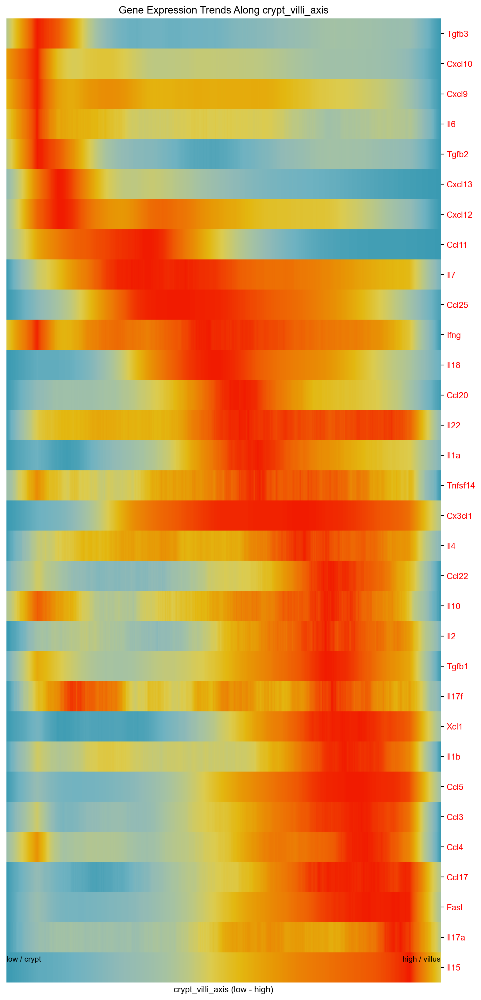

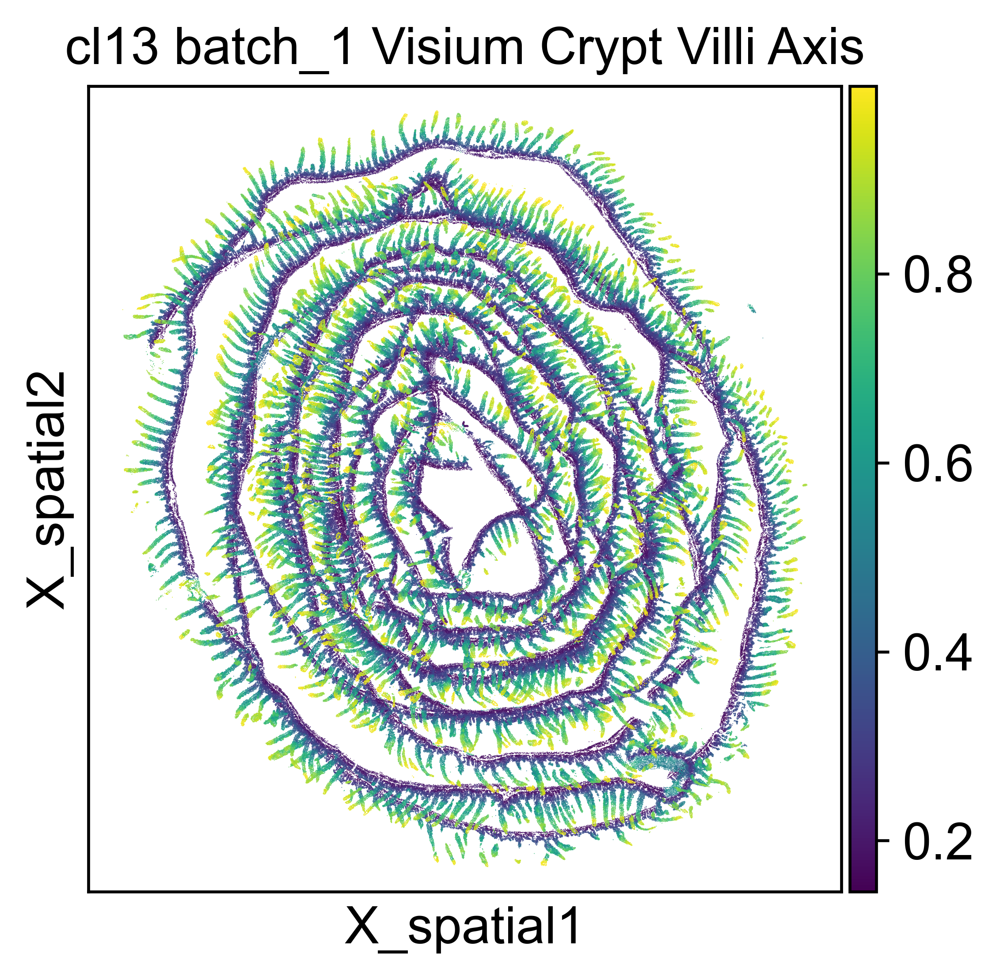

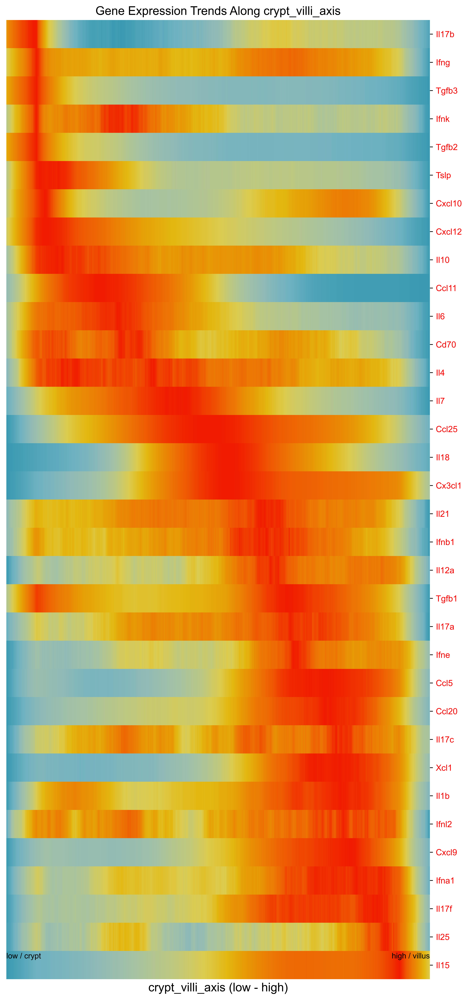

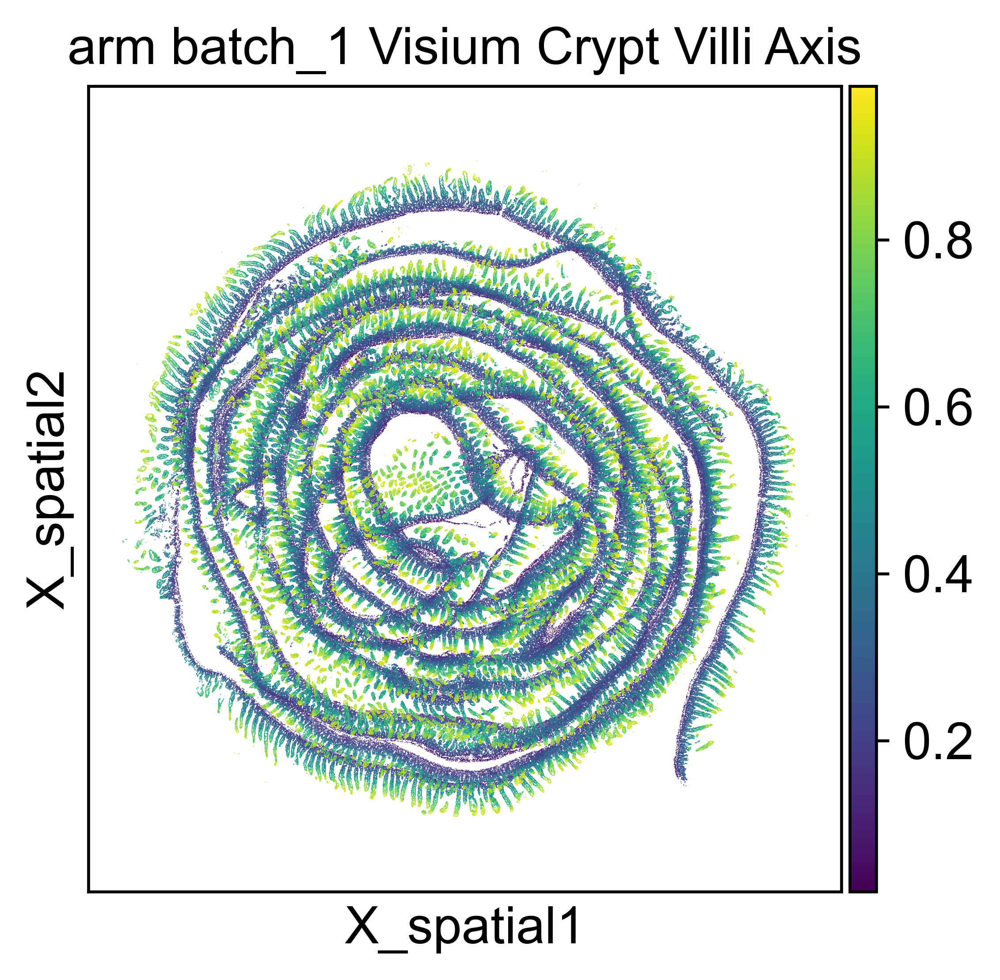

In [ ]:
for dataset_name, dataset_adata in datasets.items():
    print(f"Running cytokine gradient for {dataset_name}...")
    run_cytokine_gradient(dataset_adata, dataset_name, df_cytokines, sortby_var)



Create an image of the spatial data to mark what section we should calculate gene trends for. This is important because some sections have very low transcript detection efficiency, which can lead to misleading trends.

Row sums cl13 (first 5): [1. 1. 1. 1. 1.]
Row sums arm (first 5): [1. 1. 1. 1. 1.]


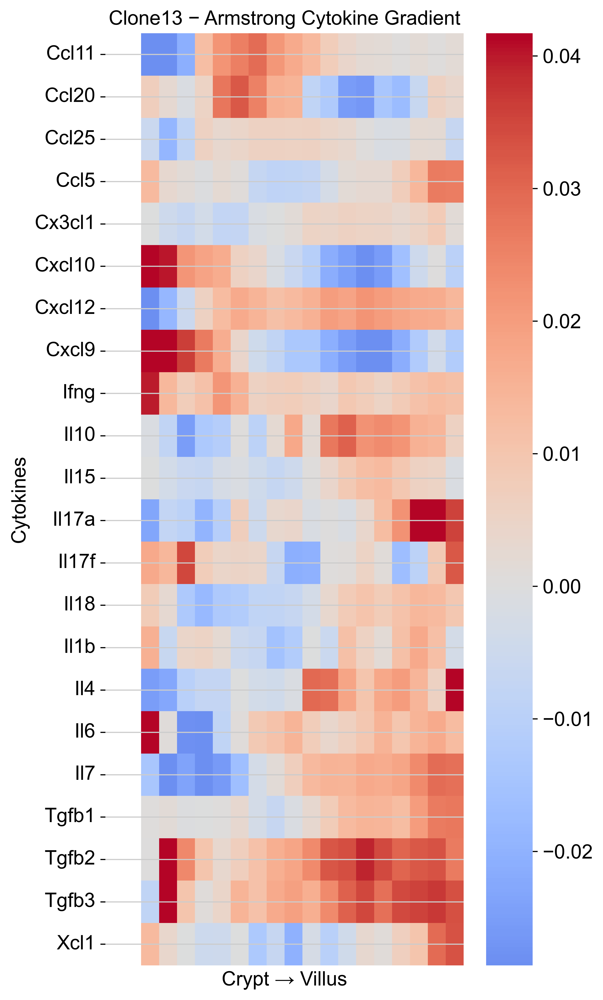

In [ ]:
# Define shared gene list
cytokines = df_cytokines["gene"].tolist()
shared_genes = sorted(
    set(cytokines)
    & set(cl13_p14_adata.var_names)
    & set(arm_p14_adata.var_names)
)

# Put both datasets on the same axis bins
n_bins = 20

axis_min = min(
    cl13_p14_adata.obs["crypt_villi_axis"].min(),
    arm_p14_adata.obs["crypt_villi_axis"].min(),
)
axis_max = max(
    cl13_p14_adata.obs["crypt_villi_axis"].max(),
    arm_p14_adata.obs["crypt_villi_axis"].max(),
)

bin_edges = np.linspace(axis_min, axis_max, n_bins + 1)

# Compute binned mean expression
def binned_expression_matrix(adata, genes, axis, bin_edges):
    X = adata[:, genes].X
    if sp.issparse(X):
        X = X.toarray()

    axis_vals = adata.obs[axis].values
    bin_ids = np.digitize(axis_vals, bin_edges) - 1

    n_bins = len(bin_edges) - 1
    mat = np.full((len(genes), n_bins), np.nan)

    for b in range(n_bins):
        mask = bin_ids == b
        if mask.sum() == 0:
            continue
        mat[:, b] = X[mask].mean(axis=0)

    return mat

# Build matrices for both datasets
cl13_mat = binned_expression_matrix(
    cl13_p14_adata,
    shared_genes,
    axis="crypt_villi_axis",
    bin_edges=bin_edges,
)

arm_mat = binned_expression_matrix(
    arm_p14_adata,
    shared_genes,
    axis="crypt_villi_axis",
    bin_edges=bin_edges,
)

# NORMALIZE SO THAT ROWS ADD TO 1
def row_normalize(mat):
    # preserve NaNs for empty bins
    row_sums = np.nansum(mat, axis=1, keepdims=True)
    row_sums[row_sums == 0] = np.nan
    return mat / row_sums

cl13_mat = row_normalize(cl13_mat)
arm_mat = row_normalize(arm_mat)

print("Row sums cl13 (first 5):", np.nansum(cl13_mat, axis=1)[:5])
print("Row sums arm (first 5):", np.nansum(arm_mat, axis=1)[:5])

# Compute difference matrix
diff_mat = cl13_mat - arm_mat

# Plot difference heatmap
plt.figure(figsize=(6, 10))
sns.heatmap(
    diff_mat,
    yticklabels=shared_genes,
    xticklabels=False,
    cmap="coolwarm",
    center=0,
    robust=True,
)
plt.title("Clone13 − Armstrong Cytokine Gradient")
plt.xlabel("Crypt → Villus")
plt.ylabel("Cytokines")
plt.tight_layout()
plt.show()
